In [28]:
from PIL import Image

img = Image.open('color.png')
pixels = img.load() 
width, height = img.size

color_json={}
for x in range(width):
    for y in range(height):
        r, g, b = pixels[x, y]
        color_json.update({ f'{x},{y}' : f'{r},{g},{b}' })

In [16]:
import json

with open('color_json.json', 'w') as fp:
    json.dump(color_json, fp)

In [17]:
img.size

(1255, 790)

<img src="color.png">

In [2]:
import numpy as np
from PIL import Image
img = Image.open('color.png')
I = np.asarray(img)
I

array([[[ 11,  40,  72],
        [ 16,  40,  66],
        [ 13,  26,  43],
        ...,
        [136,   4,  28],
        [115,  12,  39],
        [ 54,   0,  23]],

       [[ 11,  38,  67],
        [ 13,  37,  61],
        [229, 242, 255],
        ...,
        [180,  33,  59],
        [150,  36,  62],
        [ 79,   9,  37]],

       [[ 18,  44,  67],
        [  3,  26,  44],
        [243, 255, 255],
        ...,
        [207,  35,  61],
        [177,  37,  64],
        [102,   7,  37]],

       ...,

       [[ 25,  34,  13],
        [ 27,  38,   6],
        [200, 214, 161],
        ...,
        [190, 214, 120],
        [185, 206, 131],
        [ 27,  45,   0]],

       [[ 25,  33,  20],
        [ 33,  42,  21],
        [211, 223, 185],
        ...,
        [199, 220, 145],
        [193, 211, 153],
        [ 37,  52,  11]],

       [[ 15,  22,  14],
        [ 30,  39,  22],
        [188, 199, 169],
        ...,
        [185, 204, 140],
        [179, 195, 146],
        [ 44,  58,  25]]

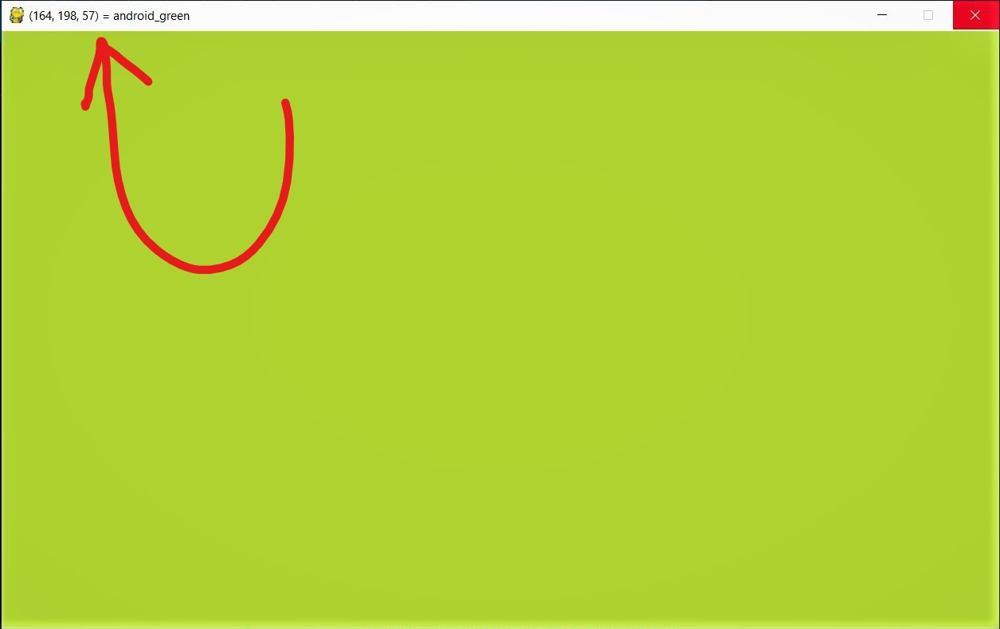

In [3]:
im = Image.fromarray(np.uint8(I))
im

In [7]:
len(I[0]), len(I)

(1255, 790)

In [38]:
img.size

(1255, 790)

In [34]:
tuple(I[450][450])

(175, 212, 47)

In [36]:
from PIL import Image

img = Image.open('color.png')
I = np.asarray(img)
width, height = img.size

color_json={}
for x in range(width):
    for y in range(height):
        r, g, b = I[y][x]
        color_json.update({ f'{x},{y}' : f'{r},{g},{b}' })

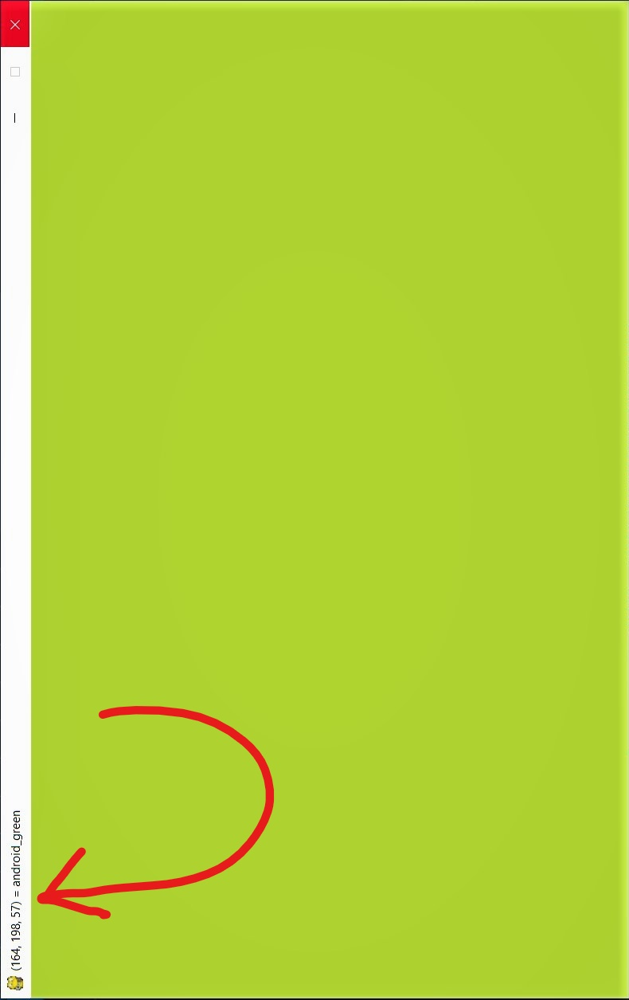

In [68]:
from PIL import Image
import numpy as np

img = Image.open('color.png')
I = np.asarray(img)

I = I.transpose(1, 0, 2)[::-1]

img = Image.fromarray(np.uint8(I))
img

In [50]:
# https://stackoverflow.com/a/66488218/11493297

import numpy as np
from PIL import Image

img = Image.open("1.6180339.png")

# getting the number of channels
channel_count = len(img.getbands())
channel_count, img.getbands()

(4, ('R', 'G', 'B', 'A'))

In [51]:
img_arr = np.reshape(img, (img.height, img.width, channel_count))
img_arr

array([[[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       ...,

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255

In [52]:
# splitting up channels
channels = [img_arr[:,:,x] for x in range(channel_count)]
channels

[array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 25

In [53]:
# setting up a shuffling order for rows
random_perm = np.random.permutation(img.height)
random_perm

array([ 33, 110, 114, 127, 147,  15, 240,  44, 120, 270,  89, 306, 250,
        20, 140, 173, 192, 124, 117, 305, 245,  73, 190, 203, 267, 143,
        27, 102, 106, 182, 150, 343,  96, 211, 235,  75, 261, 273, 302,
       168, 228, 204, 111,  74,  56, 247, 345, 300,  53,  64, 210,  83,
       233,  58,   1, 239,  34, 223, 256, 346, 269, 317, 353, 238, 187,
       271, 116, 205,  25, 257,  19, 214,  80, 231, 122, 152, 160, 259,
       125, 260, 265,  23, 347,  47, 301,  41,  24, 308, 165, 310, 169,
       109,  48, 207,   8, 141, 126, 167, 178, 272, 137, 252, 348, 212,
        94,  70, 105, 220, 319, 164,  45,  98, 100, 202, 232, 339,  37,
        61,  28, 287, 359,  30, 151, 157, 104, 221, 156, 194, 183,  92,
        67,  16, 185,   9,  84, 318, 130,  63, 337, 323, 355, 108,  59,
       216,  69, 255,  99, 253, 244, 351, 342, 226, 237, 331,  77, 324,
       304, 243,  14, 174, 133,  50,  49, 201,  46,  55, 297, 191, 155,
        65,  38, 286,  87, 186,  71, 215, 341,  91, 197, 217, 34

In [54]:
# reordering the rows with respect to the permutation
shuffled_img_arr = np.dstack([x[random_perm, :] for x in channels]).astype(np.uint8)
shuffled_img_arr

array([[[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       ...,

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        ...,
        [255, 255, 255, 255],
        [255, 255, 255, 255],
        [255, 255, 255, 255]],

       [[255

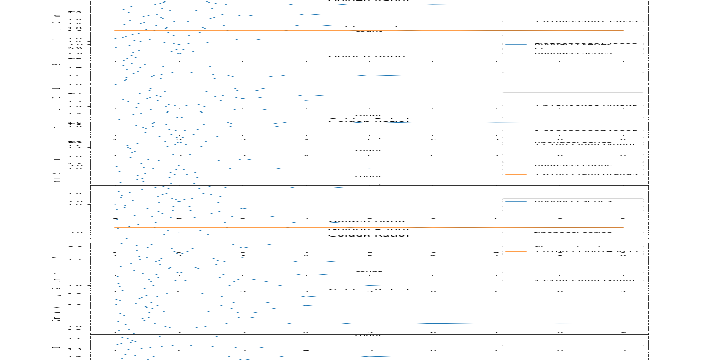

In [55]:
# creating the Image from the shuffled array
shuffled_img = Image.fromarray(shuffled_img_arr)
shuffled_img

In [57]:
# saving the shuffled file
shuffled_img.save("shuffled_me.png")

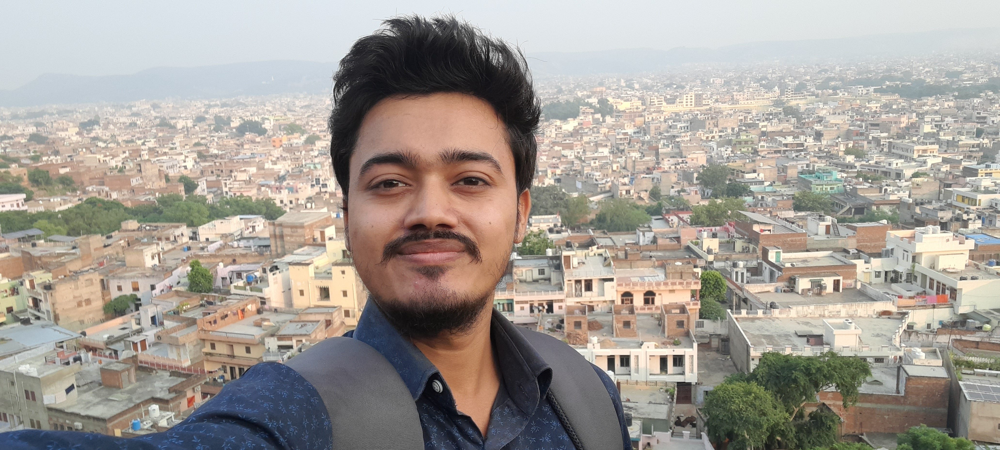

In [74]:
Image.fromarray(img_arr)

In [64]:
from PIL import Image
import numpy as np

img = Image.open('me.jpg')
I = np.asarray(img)
I

array([[[215, 224, 229],
        [215, 224, 229],
        [215, 224, 231],
        ...,
        [224, 228, 227],
        [227, 231, 230],
        [227, 231, 230]],

       [[215, 224, 229],
        [215, 224, 229],
        [216, 225, 232],
        ...,
        [224, 228, 227],
        [226, 230, 229],
        [226, 230, 229]],

       [[215, 224, 229],
        [216, 225, 230],
        [217, 226, 233],
        ...,
        [223, 227, 226],
        [224, 228, 227],
        [222, 226, 225]],

       ...,

       [[ 55,  74, 106],
        [ 55,  74, 106],
        [ 55,  74, 106],
        ...,
        [168, 174, 172],
        [169, 174, 170],
        [162, 167, 163]],

       [[ 55,  74, 106],
        [ 55,  74, 106],
        [ 56,  75, 107],
        ...,
        [117, 123, 121],
        [119, 124, 120],
        [120, 125, 121]],

       [[ 55,  74, 106],
        [ 54,  73, 105],
        [ 56,  75, 107],
        ...,
        [109, 115, 113],
        [110, 115, 111],
        [110, 115, 111]]

In [65]:
wh = width, height = len(I[0]), len(I)
wh, img.size

((4128, 1860), (4128, 1860))

In [62]:
I[0] # is first row

array([[255, 255, 255, 255],
       [255, 255, 255, 255],
       [255, 255, 255, 255],
       ...,
       [255, 255, 255, 255],
       [255, 255, 255, 255],
       [255, 255, 255, 255]], dtype=uint8)

In [63]:
# Program to display the Fibonacci sequence up to n-th term

# nterms = int(input("How many terms? "))
nterms = 10

# first two terms
n1, n2 = 0, 1
count = 0
x,y = [],[]

# check if the number of terms is valid
if nterms <= 0:
    print("Please enter a positive integer")
# if there is only one term, return n1
elif nterms == 1:
    print("Fibonacci sequence upto",nterms,":")
    print(n1)
# generate fibonacci sequence
else:
    while count < nterms:
        try:
            print((count, n1, n2/n1))
            x.append(count)
            y.append(n2/n1)
        except:
            pass
        nth = n1 + n2
        # update values
        n1 = n2
        n2 = nth
        count += 1

(1, 1, 1.0)
(2, 1, 2.0)
(3, 2, 1.5)
(4, 3, 1.6666666666666667)
(5, 5, 1.6)
(6, 8, 1.625)
(7, 13, 1.6153846153846154)
(8, 21, 1.619047619047619)
(9, 34, 1.6176470588235294)


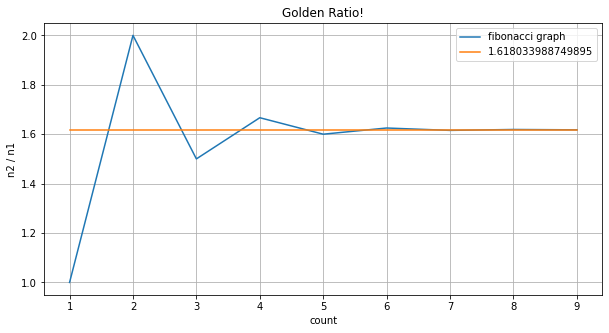

In [59]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10, 5))

# line 1 points
# plotting the line 1 points
plt.plot(x, y, label = "fibonacci graph")

# line 2 points
f = [1.618033988749895]*(count-1)
# plotting the line 2 points
plt.plot(x, f, label = "1.618033988749895")

# naming the x axis
plt.xlabel('count')
# naming the y axis
plt.ylabel('n2 / n1')
# giving a title to my graph
plt.title('Golden Ratio!')

plt.grid()
# show a legend on the plot
plt.legend()

# function to show the plot
plt.show()
fig.savefig('1.6180339.png')